In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib as mpl
from matplotlib import rcParams
from matplotlib.patches import Rectangle
from scipy.stats import relfreq

from matplotlib.ticker import FormatStrFormatter

sns.set(context='poster', style='white')
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = 'arial'

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
df_tracks = pd.read_csv('../data/billboard-lyrics-spotify.csv')
df_tracks.head()

,artist_all,artist_base,rank,song,year,artist_featured,song_clean,artist_clean,lyrics,danceability,...,tempo,time_signature,popularity,explicit,duration_min,num_words,words_per_sec,num_uniq_words,decade,uniq_ratio
0,percy faith,percy faith,1,theme from a summer place,1960,NaN,theme from a summer place,percy faith,theres a summer place where it may rain or sto...,0.213,...,181.746,3.0,54.0,False,2.753567,104.0,0.629487,58.0,1960,0.557692
1,jim reeves,jim reeves,2,he'll have to go,1960,NaN,hell have to go,jim reeves,put your sweet lips a little closer to the pho...,0.429,...,79.076,3.0,51.0,False,2.373783,152.0,1.067213,69.0,1960,0.453947
2,the everly brothers,the everly brothers,3,cathy's clown,1960,NaN,cathys clown,the everly brothers,dont want your love any more dont want your k...,0.499,...,120.240,4.0,25.0,False,2.429117,121.0,0.830206,64.0,1960,0.528926
3,johnny preston,johnny preston,4,running bear,1960,NaN,running bear,johnny preston,on the bank of the river stood running bear yo...,0.772,...,119.987,4.0,25.0,False,2.636667,220.0,1.390645,89.0,1960,0.404545
4,mark dinning,mark dinning,5,teen angel,1960,NaN,teen angel,mark dinning,teen angel teen angel teen angel that fateful ...,0.569,...,101.521,4.0,26.0,False,2.664883,109.0,0.681706,73.0,1960,0.669725


In [3]:
df_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6301 entries, 0 to 6300
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist_all        6301 non-null   object 
 1   artist_base       6301 non-null   object 
 2   rank              6301 non-null   int64  
 3   song              6301 non-null   object 
 4   year              6301 non-null   int64  
 5   artist_featured   734 non-null    object 
 6   song_clean        6301 non-null   object 
 7   artist_clean      6301 non-null   object 
 8   lyrics            6250 non-null   object 
 9   danceability      6153 non-null   float64
 10  energy            6153 non-null   float64
 11  key               6153 non-null   float64
 12  loudness          6153 non-null   float64
 13  mode              6153 non-null   float64
 14  speechiness       6153 non-null   float64
 15  acousticness      6153 non-null   float64
 16  instrumentalness  6153 non-null   float64


In [ ]:
df_tracks.describe().transpose()

In [ ]:
df_tracks

In [ ]:
pd.isnull(df_tracks).sum()

## Correlation

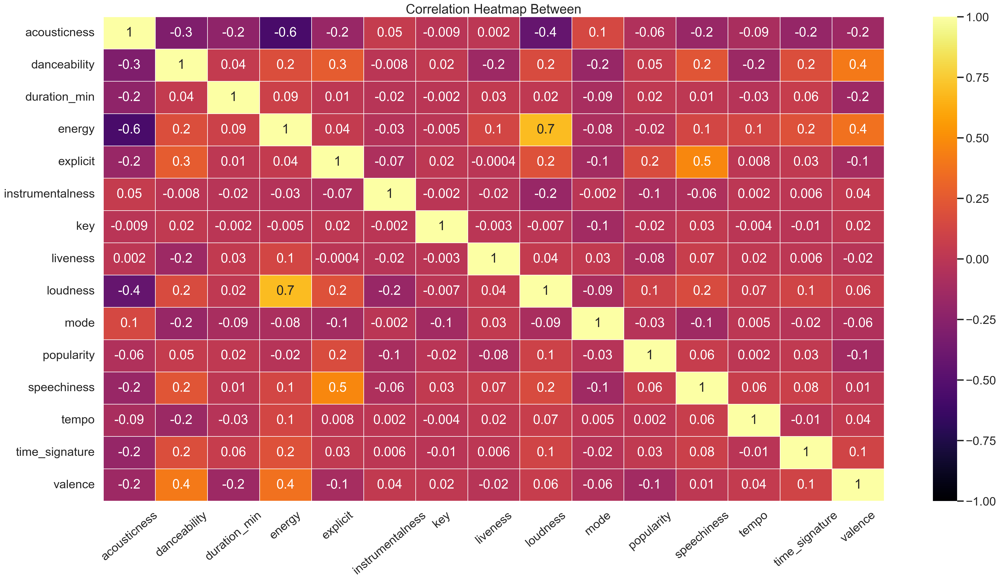

In [179]:
df_corr = df_tracks[
        [
            'acousticness',
            'danceability',
            'duration_min',
            'energy',
            'explicit',
            'instrumentalness',
            'key',
            'liveness',
            'loudness',
            'mode',
            'popularity',
            'speechiness',
            'tempo',
            'time_signature',
            'valence',
        ]
            ]
corr_df = df_corr.corr(method='pearson', numeric_only=True)

plt.figure(figsize=(32, 16))
heatmap = sns.heatmap(corr_df, annot=True, fmt='.1g', vmin=-1, vmax=1, center=0, cmap='inferno',linewidths=1, linecolor='white');
heatmap.set_title("Correlation Heatmap Between");
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=40);

In [132]:
def scatter_decade_plot(df, x, y,
                        xticks=np.arange(0, 1.1, .25),
                        yticks=np.arange(0, 1.1, .2),
                        ylim = (0,1)):
    
    # for colorbar labeling
    df['Year'] = df['year']
    
    # generate subplot axes
    axes = list()
    plt.figure(figsize=(20, 14))
    for index in [1,2,3,4,9,10,11]:
        axes.append(plt.subplot(2, 8, index))
    axes.append(plt.subplot(1, 2, 2))

    # for each decade, plot smaller scatter plots; selectively label axes
    for index, decade in enumerate(range(1960, 2023, 10)):
        df_decade = df[df['decade'] == decade]
        df_decade.plot.scatter(ax=axes[index], x=x, y=y,
                               alpha=0.15, color='black')
        axes[index].set(xlabel='', ylabel='', title='{}s'.format(decade))
        if index % 4 != 0:
            for yticklabel in axes[index].get_yticklabels():
                yticklabel.set_visible(False)
                
    # adjust ticks and limits
    for ax in axes:
        plt.subplots_adjust(right=1.5)
        ax.grid(True)
        ax.set_xticks(xticks)
        ax.set_xticklabels(xticks, fontsize=24)
        ax.set_yticks(yticks)
        ax.set_yticklabels(yticks, fontsize=24)
        ax.set_ylim(ylim)
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        

    axes[0].set_ylabel(y.title(), labelpad=20, y=0, fontsize=24)
    axes[5].set_xlabel(x.title(), labelpad=24,  fontsize=24)

    # large color scatter plot of all songs
    df.plot.scatter(ax=axes[7], x=x, y=y,
                    alpha=0.6, c='Year', cmap='plasma')
    axes[7].set_xlabel(x.title(), fontsize=24,labelpad=24)
    for yticklabel in axes[7].get_yticklabels():
        yticklabel.set_visible(False)
    axes[7].set(title='1960-2022', ylabel='')
    axes[7].grid(True)
    plt.subplots_adjust(wspace=0.2, hspace=.3)
    plt.suptitle('{} vs. {} Over Time'.format(x.title(), y.title()),
                 fontsize=32,
                 y=1
                 )

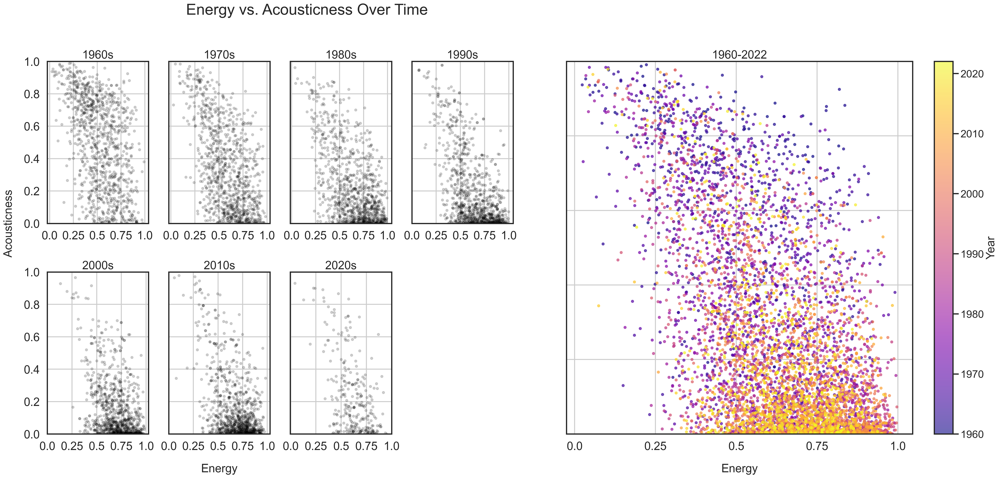

In [133]:
scatter_decade_plot(df_tracks, 'energy', 'acousticness')

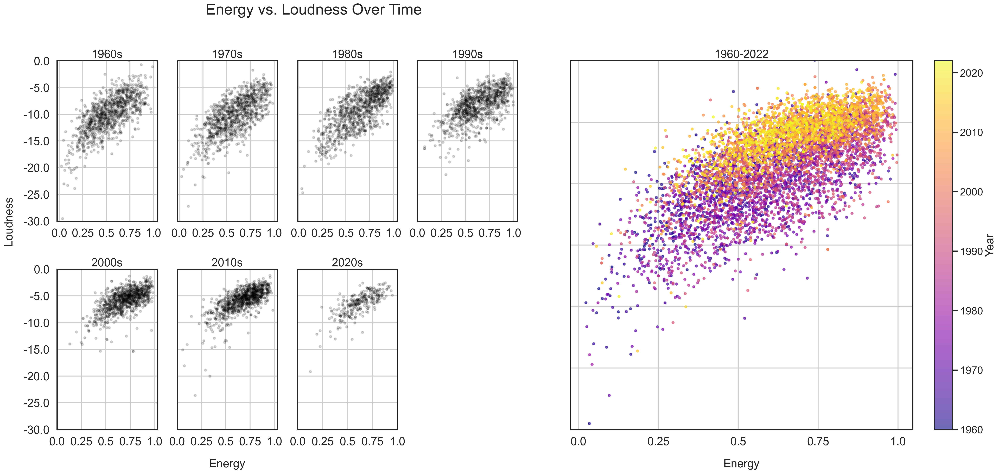

In [134]:
scatter_decade_plot(df_tracks, 'energy', 'loudness', yticks=np.arange(-30, 1, 5), ylim=(-30,0))

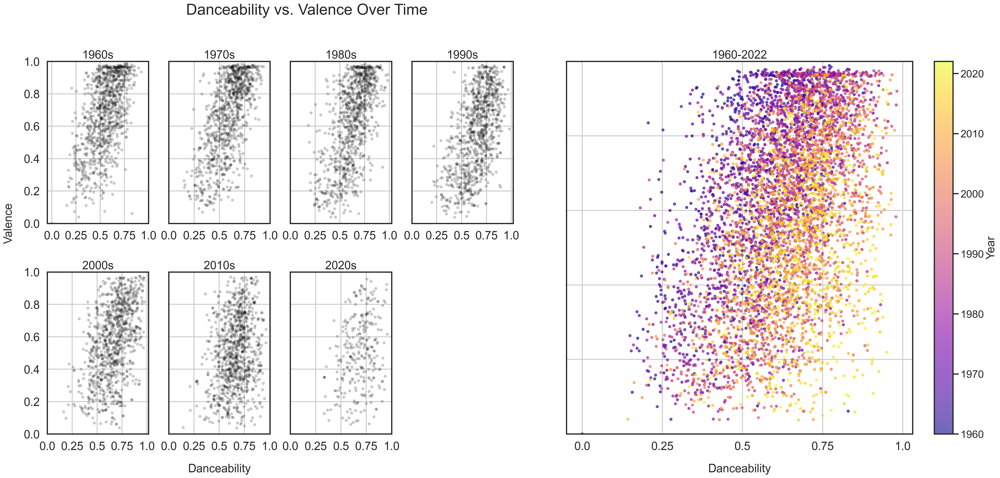

In [135]:
scatter_decade_plot(df_tracks, 'danceability', 'valence')

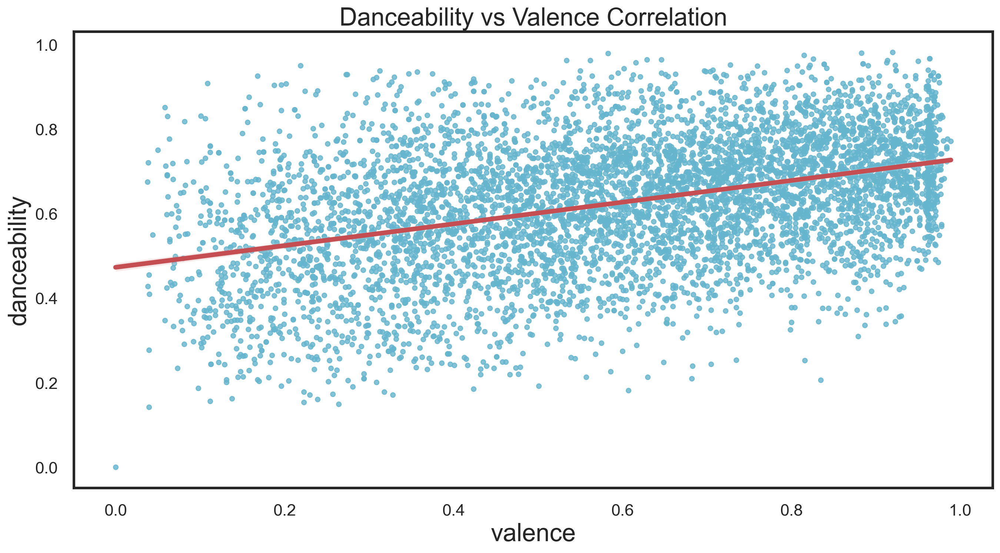

In [158]:
plt.figure(figsize=(16,8))
sns.regplot(data=df_tracks, y='danceability', x='valence', scatter_kws={"color": "c", "s": 20}, line_kws={"color": "r"}).set(title='Danceability vs Valence Correlation')
plt.tick_params(axis='both', which='major', labelsize=16)

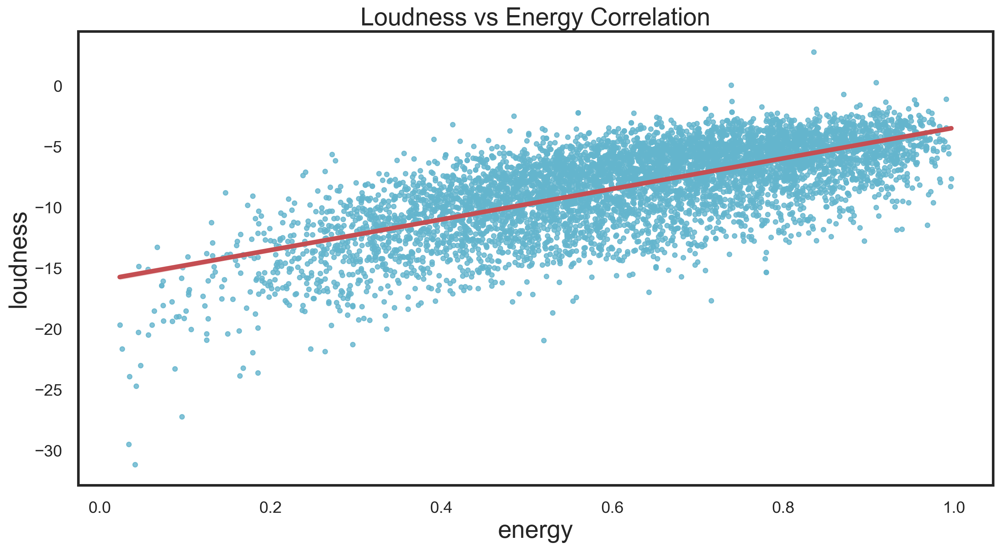

In [157]:
plt.figure(figsize=(16,8))
sns.regplot(data=df_tracks, y='loudness', x='energy', scatter_kws={"color": "c", "s": 20}, line_kws={"color": "r"}).set(title='Loudness vs Energy Correlation')
plt.tick_params(axis='both', which='major', labelsize=16)

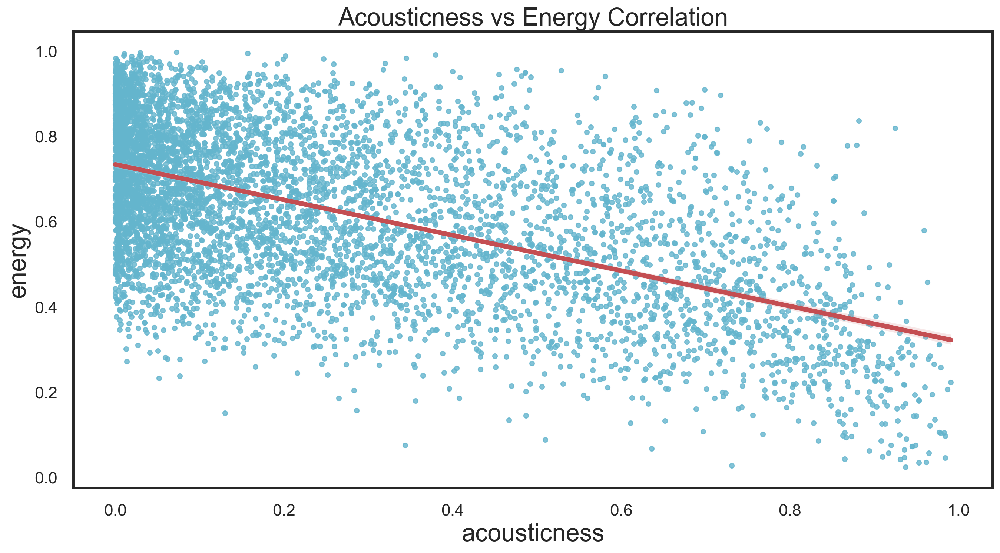

In [156]:
plt.figure(figsize=(16,8))
sns.regplot(data=df_tracks, y='energy', x='acousticness', scatter_kws={"color": "c", "s": 20}, line_kws={"color": "r"}).set(title='Acousticness vs Energy Correlation')
plt.tick_params(axis='both', which='major', labelsize=16)